In [ ]:
import skimage.io, skimage.color
import numpy as np
import matplotlib.pyplot as plt

In [ ]:

def calculate_gradient(img, template): #template:filtre veya kernel(çekirdek)gradyan hesaplamak için gerekli matsal değerleri içeris
  ts = template.shape[0] #template tek kenar uzunluğu
  new_img = np.zeros((img.shape[0]+ts-1, img.shape[1]+ts-1)) #ts-1 padding işlemi, kenardaki pikseller de kaydırma sonucu hesaba alınsın diye
  new_img[np.uint16((ts-1)/2.0):img.shape[0]+np.uint16((ts-1)/2.0),
          np.uint16((ts-1)/2.0):img.shape[1]+np.uint16((ts-1)/2.0)] = img #imagei al boş matrise kopyala
  result = np.zeros((new_img.shape))
  ts_b = (ts-1)/2.0
  for r in np.uint16(np.arange((ts-1)/2.0, img.shape[0]+(ts-1)/2.0)):
    for c in np.uint16(np.arange((ts-1)/2.0, img.shape[1]+(ts-1)/2.0)): # Düzeltme burada yapıldı
      curr_region = new_img[r-np.uint16(ts_b):r+np.uint16(ts_b) + 1,
                            c-np.uint16(ts_b):c+np.uint16(ts_b)+1]
      curr_result = curr_region * template
      score = np.sum(curr_result)
      result[r,c] = score
  result_img = result[np.uint16(ts_b):result.shape[0]-np.uint16(ts_b),
                      np.uint16(ts_b):result.shape[1]-np.uint16(ts_b)]
  return result_img

In [ ]:
img_path = "/content/crop001512.png"
img = skimage.io.imread(img_path)

# Convert to grayscale if it's a color image
if img.ndim == 3:
    img = skimage.color.rgb2gray(img)

calculate_gradient(img, np.array([[-1,0,1],[-2,0,2],[-1,0,1]]))

array([[ 0.67776784, -0.01701765, -0.03213843, ..., -0.02158863,
         0.03782392, -1.99702667],
       [ 0.94548235, -0.04973647, -0.07186706, ..., -0.07912   ,
         0.02122118, -2.46329882],
       [ 0.98125098, -0.08724784, -0.07438196, ..., -0.20808   ,
        -0.11806627, -1.95184078],
       ...,
       [ 2.34470431, -0.03612745,  0.03893294, ..., -0.03736353,
        -0.05068275, -2.27578275],
       [ 2.32708353,  0.01316353,  0.04705882, ..., -0.03703529,
        -0.0489251 , -2.31383765],
       [ 1.72144275,  0.0481749 ,  0.05490196, ..., -0.03108902,
        -0.03238275, -1.75022588]])

In [ ]:
def gradient_magnitude(horizontal_gradient, vertical_gradient): #bu iki parametre matris
  horizontal_gradient_square = np.power(horizontal_gradient,2) #yatay gradyandaki her bir elamanın karesi
  vertical_gradient_square = np.power(vertical_gradient,2) #dikey gradyandaki her bir elemanın karesi
  sum_squares = horizontal_gradient_square + vertical_gradient_square
  grad_magnitude = np.sqrt(sum_squares)
  return grad_magnitude
  #masanın dikey kenarlarını bulmak için yatay gradyan dikey kenarlarını bulmak için yatay gradyan kullanılır
  #numpyın güzel yönü tüm bu işlemleri for döngüsü olmadan yapabilmemiz

def gradient_direction(horizontal_gradient, vertical_gradient):
  grad_direction = np.arctan(vertical_gradient/horizontal_gradient+0.00000001)
  grad_direction = np.rad2deg(grad_direction) #radyandan dereceye çevirme
  grad_direction = grad_direction % 180 #360 dereceyi 0-180 arasına indirger
  return grad_direction


Girdiler (Fonksiyona Verilen Bilgiler)Değişken AdıNe Taşıyor?Görevi (Mala Anlatır Gibi)cell_directionBir matris (dizi).Bu, hücredeki her bir pikselin kenar yönünü (açısını, mesela 45°, 90°, 135° gibi) tutar.cell_magnitudeBir matris (dizi).Bu, hücredeki her bir pikselin kenarının ne kadar güçlü olduğunu (parlaklığını) tutar.hist_binsBir dizi (genellikle 9 elemanlı).Histogramımızdaki kategorilerin (kutuların) merkez açılarını tutar. Örneğin: $[10^{\circ}, 30^{\circ}, 50^{\circ}, \dots]$ gibi. Kenar yönlerini bu açılara göre dağıtacağız.

In [ ]:
def HOG_cell_histogram(cell_direction, cell_magnitude, hist_bins):
    # hist_bins: Merkezi açıları (örn: 10, 30, ..., 170)
    num_bins = hist_bins.size
    bin_size = 180.0 / num_bins # Bölme genişliği (örn: 20 derece)
    HOG_cell_hist = np.zeros(shape=(num_bins))

    for curr_direction, curr_magnitude in zip(cell_direction.flatten(), cell_magnitude.flatten()):
        # 0-180 derece aralığı dışındaysa döngüsel olarak ayarla
        curr_direction = curr_direction % 180

        # Bölme indeksini hesapla
        # Örn: 0-20, 20-40, ... Bölme merkezi: 10, 30, ...
        # (curr_direction / bin_size) -> Hangi bölmede olduğunu gösteren kayan nokta indeksi
        bin_float_index = curr_direction / bin_size

        # Birinci bölmenin indeksi (daha düşük açılı olan)
        # Örn: 10 derece -> (10/20)=0.5 -> floor(0.5)=0. Birinci bin'in indeksi.
        # 175 derece -> (175/20)=8.75 -> floor(8.75)=8.
        first_bin_idx = np.floor(bin_float_index)

        # İkinci bölmenin indeksi (daha yüksek açılı olan)
        second_bin_idx = (first_bin_idx + 1) % num_bins

        # Eğer açı 180'e çok yakınsa ve first_bin_idx = num_bins - 1 ise, second_bin_idx 0 olmalıdır.
        if first_bin_idx == num_bins - 1:
            second_bin_idx = 0

        # Kesirli kısım (Interpolasyon için ağırlık)
        weight_for_second_bin = bin_float_index - first_bin_idx
        weight_for_first_bin = 1.0 - weight_for_second_bin

        # Ağırlıklı oylama
        HOG_cell_hist[np.uint8(first_bin_idx)] += weight_for_first_bin * curr_magnitude
        HOG_cell_hist[np.uint8(second_bin_idx)] += weight_for_second_bin * curr_magnitude

    return HOG_cell_hist

Diyelim ki bir pikselin açısı $55^{\circ}$ ve gücü $10$ olsun.En yakın kutucuklar $50^{\circ}$ ve $70^{\circ}$ olsun (Aradaki Açı Aralığı: $20^{\circ}$).$50^{\circ}$ Kutucuğu: $55^{\circ}$'ye çok yakın. Bu yüzden $10$ gücünün büyük bir kısmını ($\approx 75\%$) bu kutucuğa verir.$70^{\circ}$ Kutucuğu: $55^{\circ}$'ye biraz daha uzak. Bu yüzden $10$ gücünün küçük bir kısmını ($\approx 25\%$) bu kutucuğa verir.Bu paylaştırma, curr_magnitude'yi kullanır ve $55^{\circ}$'nin $50^{\circ}$'den ne kadar uzakta olduğunu ölçen formülle yapılır. Bu sayede, kenar bilgisi sadece tek bir kutucuğa değil, komşu iki kutucuğa yumuşak bir şekilde dağıtılmış olur.

/tmp/ipython-input-3674914790.py:11: RuntimeWarning: divide by zero encountered in divide
  grad_direction = np.arctan(vertical_gradient/horizontal_gradient+0.00000001)
/tmp/ipython-input-3674914790.py:11: RuntimeWarning: invalid value encountered in divide
  grad_direction = np.arctan(vertical_gradient/horizontal_gradient+0.00000001)


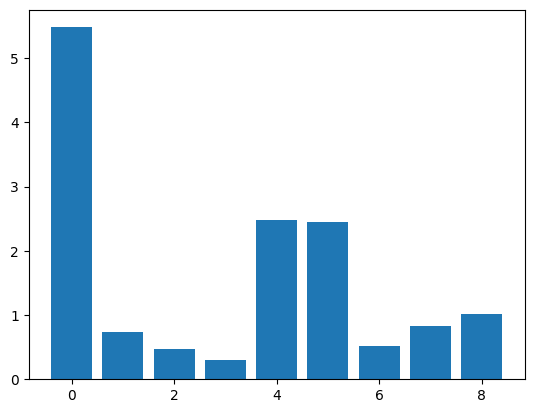

In [ ]:
import skimage.io, skimage.color
import numpy
import matplotlib.pyplot


img_path = "/content/crop001512.png"
img = skimage.io.imread(img_path)

# Convert to grayscale if it's a color image
if img.ndim == 3:
    img = skimage.color.rgb2gray(img)

horizontal_mask = np.array([-1, 0, 1])
vertical_mask = np.array([[-1],
                             [0],
                             [1]])

horizontal_gradient = calculate_gradient(img, horizontal_mask)
vertical_gradient = calculate_gradient(img, vertical_mask)

grad_magnitude = gradient_magnitude(horizontal_gradient, vertical_gradient)
grad_direction = gradient_direction(horizontal_gradient, vertical_gradient)

grad_direction = grad_direction % 180
hist_bins = np.array([10,30,50,70,90,110,130,150,170])

# Histogram of the first cell in the first block.
cell_direction = grad_direction[:8, :8]
cell_magnitude = grad_magnitude[:8, :8]
HOG_cell_hist = HOG_cell_histogram(cell_direction, cell_magnitude, hist_bins)

matplotlib.pyplot.bar(x=np.arange(9), height=HOG_cell_hist, align="center", width=0.8)
matplotlib.pyplot.show()

Yatay Maske: [-1, 0, 1] $\rightarrow$ Soldaki pikseli çıkar, sağdaki pikseli ekle. Aradaki fark büyükse, dikey bir kenar var demektir.Dikey Maske: [[-1], [0], [1]] $\rightarrow$ Yukarıdaki pikseli çıkar, aşağıdaki pikseli ekle. Aradaki fark büyükse, yatay bir kenar var demektir.

In [44]:
import skimage.io, skimage.color
import numpy as np
import matplotlib.pyplot as plt
import math # sin ve cos için eklendi

# --- TEMEL GRADYAN VE HİSTOGRAM FONKSİYONLARI (ÖNCEKİ KODUNUZ) ---

def calculate_gradient(img, template):
    # Template'in tek kenar uzunluğu
    ts = template.shape[0]

    # Padding işlemi için yeni matris oluşturma
    pad_size = np.uint16((ts - 1) / 2.0)
    new_img = np.zeros((img.shape[0] + 2 * pad_size, img.shape[1] + 2 * pad_size))

    # Orijinal görüntüyü ortasına kopyala
    new_img[pad_size:img.shape[0] + pad_size,
            pad_size:img.shape[1] + pad_size] = img

    result = np.zeros((img.shape[0], img.shape[1])) # Sonuç, orijinal görüntü boyunda olmalı

    # Konvolüsyon/Korelasyon işlemi
    for r in range(img.shape[0]):
        for c in range(img.shape[1]):
            # İlgili bölgeyi al (r, c merkezli, template boyutunda)
            curr_region = new_img[r:r + ts, c:c + ts]

            # Matris çarpımı (element-wise)
            curr_result = curr_region * template

            # Toplamı hesapla
            score = np.sum(curr_result)

            # Sonucu orijinal görüntüdeki karşılık gelen pozisyona yaz
            result[r, c] = score

    return result

def gradient_magnitude(horizontal_gradient, vertical_gradient):
    horizontal_gradient_square = np.power(horizontal_gradient, 2)
    vertical_gradient_square = np.power(vertical_gradient, 2)
    sum_squares = horizontal_gradient_square + vertical_gradient_square
    grad_magnitude = np.sqrt(sum_squares)
    return grad_magnitude

def gradient_direction(horizontal_gradient, vertical_gradient):
    # arctan2 kullanmak, sıfıra bölme ve çeyrek sorunlarını çözer
    grad_direction = np.arctan2(vertical_gradient, horizontal_gradient)
    grad_direction = np.rad2deg(grad_direction)
    # HOG için imzasız yön (0-180 derece)
    grad_direction = grad_direction % 180
    return grad_direction

def HOG_cell_histogram(cell_direction, cell_magnitude, hist_bins):
    # Hist_bins: Merkezi açılar (örn: 10, 30, ..., 170)
    num_bins = hist_bins.size # 9 bin
    bin_size = 180.0 / num_bins # 20 derece
    HOG_cell_hist = np.zeros(shape=(num_bins))

    for curr_direction, curr_magnitude in zip(cell_direction.flatten(), cell_magnitude.flatten()):
        # Yönü 0-180 aralığına getir
        curr_direction = curr_direction % 180

        # İki bin'in indekslerini hesaplamak için kayan nokta indeksi
        bin_float_index = curr_direction / bin_size

        # Birinci (daha düşük açılı) bin'in indeksi
        first_bin_idx = np.uint8(np.floor(bin_float_index))

        # İkinci (daha yüksek açılı) bin'in indeksi (döngüsel)
        second_bin_idx = (first_bin_idx + 1) % num_bins

        # İkinci bin için ağırlık (kesirli kısım)
        weight_for_second_bin = bin_float_index - first_bin_idx

        # Birinci bin için ağırlık
        weight_for_first_bin = 1.0 - weight_for_second_bin

        # Ağırlıklı oylama (magnitude ile çarpılır)
        HOG_cell_hist[first_bin_idx] += weight_for_first_bin * curr_magnitude
        HOG_cell_hist[second_bin_idx] += weight_for_second_bin * curr_magnitude

    return HOG_cell_hist

# --- YENİ EKLENEN HOG ÇEKİRDEK FONKSİYONLARI ---

def normalize_block(block_histogram, method="L2", epsilon=1e-5):
    """Blok histogramını normalize eder."""

    # L2-norm: h / sqrt(||h||² + epsilon²)

    # L2 normun karesi (elemanların karelerinin toplamı)
    l2_norm_sq = np.sum(block_histogram ** 2)

    # Payda: Normun karesi + epsilon'un karekökü
    denominator = np.sqrt(l2_norm_sq + epsilon**2)

    # Normalize edilmiş vektör
    normalized_hist = block_histogram / denominator

    # (Opsiyonel: L2-Hys - 0.2'den büyük değerleri 0.2'ye kırpar ve tekrar normalize eder)
    if method == "L2-Hys":
        normalized_hist = np.clip(normalized_hist, 0, 0.2)
        l2_norm_sq_hys = np.sum(normalized_hist ** 2)
        denominator_hys = np.sqrt(l2_norm_sq_hys + epsilon**2)
        normalized_hist = normalized_hist / denominator_hys

    return normalized_hist


def compute_hog_descriptor(grad_direction, grad_magnitude, cell_size=(8, 8), block_size=(2, 2), num_bins=9):
    """Tam HOG descriptor vektörünü hesaplar."""

    img_h, img_w = grad_direction.shape
    cell_h, cell_w = cell_size
    block_h, block_w = block_size

    # Hücre boyutlarına tam bölünebilen kısımları al
    cell_rows = img_h // cell_h
    cell_cols = img_w // cell_w

    # Toplam hücre sayısı
    num_cells = cell_rows * cell_cols

    # Bloklar: 1x1 adım (kayan pencere) ile taranır
    # (2x2 bloklar 1 hücre kaydırılarak ilerler)
    block_rows = cell_rows - block_h + 1
    block_cols = cell_cols - block_w + 1

    # Tek bir bloğun boyutu: block_h * block_w * num_bins (örn: 2*2*9 = 36)
    block_descriptor_size = block_h * block_w * num_bins

    # Toplam HOG vektör boyutu
    hog_descriptor = np.zeros(block_rows * block_cols * block_descriptor_size)
    descriptor_idx = 0

    # 1. Tüm hücreler için histogramları hesapla
    cell_histograms = np.zeros((cell_rows, cell_cols, num_bins))
    hist_bins = np.arange(num_bins) * (180.0 / num_bins) + (180.0 / num_bins / 2) # Merkezi açılar

    for r in range(cell_rows):
        for c in range(cell_cols):
            r_start, r_end = r * cell_h, (r + 1) * cell_h
            c_start, c_end = c * cell_w, (c + 1) * cell_w

            cell_dir = grad_direction[r_start:r_end, c_start:c_end]
            cell_mag = grad_magnitude[r_start:r_end, c_start:c_end]

            cell_histograms[r, c, :] = HOG_cell_histogram(cell_dir, cell_mag, hist_bins)

    # 2. Blokları tara ve normalize et
    for br in range(block_rows):
        for bc in range(block_cols):

            # Bloğun kapsadığı hücrelerin histogramlarını seç
            # (Örn: (br, bc) bloğu, hücre [br:br+2, bc:bc+2] aralığını kapsar)
            block_hists = cell_histograms[br:br + block_h, bc:bc + block_w, :]

            # Blok histogramlarını 1D vektöre birleştir (36 boyutlu)
            block_vector = block_hists.flatten()

            # Normalize et
            normalized_block = normalize_block(block_vector, method="L2-Hys")

            # Ana HOG vektörüne ekle
            hog_descriptor[descriptor_idx:descriptor_idx + block_descriptor_size] = normalized_block
            descriptor_idx += block_descriptor_size

    return hog_descriptor

# --- GÖRSELLEŞTİRME FONKSİYONU ---
# --- SADECE DÜZELTİLMİŞ GÖRSELLEŞTİRME FONKSİYONU ---

def visualize_hog(image, grad_magnitude, grad_direction, cell_size=(8, 8), num_bins=9):
    """HOG özelliklerini (yönelim histogramlarını) görselleştirir."""

    img_h, img_w = grad_direction.shape
    cell_h, cell_w = cell_size

    cell_rows = img_h // cell_h
    cell_cols = img_w // cell_w

    bin_size = 180.0 / num_bins
    hist_bins = np.arange(num_bins) * bin_size + (bin_size / 2)

    # Tüm hücreler için histogramları hesapla
    cell_histograms = np.zeros((cell_rows, cell_cols, num_bins))
    for r in range(cell_rows):
        for c in range(cell_cols):
            r_start, r_end = r * cell_h, (r + 1) * cell_h
            c_start, c_end = c * cell_w, (c + 1) * cell_w

            cell_dir = grad_direction[r_start:r_end, c_start:c_end]
            cell_mag = grad_magnitude[r_start:r_end, c_start:c_end]
            cell_histograms[r, c, :] = HOG_cell_histogram(cell_dir, cell_mag, hist_bins)

    # Görselleştirmeyi ve orijinal görüntüyü yan yana göster
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # 1. Orijinal Görüntü
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title("Orijinal Görüntü")
    axes[0].axis('off')

    # 2. HOG/Difüzyon Görselleştirmesi
    axes[1].imshow(image, cmap='gray') # Arka plana orijinal görüntüyü koy
    axes[1].set_title("HOG Difüzyon Okları")
    axes[1].axis('off')

    # Okların çizilmesi için matrisleri oluştur
    X_pos, Y_pos, U, V = [], [], [], []

    # Büyüklük çarpanı: Ok uzunluğunu kontrol eden ana faktör.
    # 1.0 değeri: Büyüklük (magnitude) ne kadar büyükse ok o kadar uzun olur.
    # Genellikle bu değeri normalize etmek gerekir.
    # Tüm histogram değerlerinin ortalaması/maksimumu üzerinden bir çarpan seçelim:

    # Ok uzunluğunu kontrol eden ana sabit çarpan.
    # Max histogram değeri 1 birim uzunluğa denk gelsin, bu birim de hücre boyutuyla orantılı olsun.
    max_hist_val = np.max(cell_histograms)

    # 0.5 çarpanı: Okun uzunluğunun hücrenin yarısını geçmemesini sağlar.
    scale_factor = 0.5 * cell_h / (max_hist_val + 1e-6)

    for r in range(cell_rows):
        for c in range(cell_cols):
            # Matplotlib'in görüntü koordinatları (X: Sütun, Y: Satır)
            center_x = c * cell_w + cell_w / 2
            center_y = r * cell_h + cell_h / 2

            hist = cell_histograms[r, c, :]

            for bin_idx in range(num_bins):
                magnitude = hist[bin_idx]
                if magnitude > 0.01: # Çok küçük oyları ihmal et

                    angle_deg = hist_bins[bin_idx]
                    angle_rad = np.deg2rad(angle_deg)

                    # Ölçeklendirilmiş uzunluk
                    length = magnitude * scale_factor

                    # Okun X ve Y bileşenleri (dx, dy)
                    u_comp = length * np.cos(angle_rad)
                    v_comp = length * np.sin(angle_rad)

                    # Okları merkeze göre kaydet
                    # Not: U bileşeni (X ekseni) ve V bileşeni (Y ekseni) olarak kaydedilir.

                    # Vektörün başlangıç noktası (center)
                    X_pos.append(center_x)
                    Y_pos.append(center_y)

                    # Vektörün bileşenleri
                    U.append(u_comp)
                    V.append(v_comp)

                    # HOG imzasız (0-180) olduğu için ok, merkezden her iki yöne de çizilmelidir.
                    # Karşıt vektör de eklenir. (plt.quiver ile pivot='mid' yerine bu yöntem daha kontrol edilebilir)
                    X_pos.append(center_x)
                    Y_pos.append(center_y)
                    U.append(-u_comp)
                    V.append(-v_comp)

    # Okları çizme (scale=1.0 ve units='xy' ile gerçek koordinat/piksel boyutu kullanılır)
    # Okların çizilmesi için X ve Y eksenlerinin ters çevrilmesi gerekebilir.
    # Ok başlıklarını kaldırmak için headwidth=0 yapılır.
    axes[1].quiver(X_pos, Y_pos, U, V,
                   color='red',
                   scale=1.0,
                   units='xy', # Koordinatların piksel biriminde kullanılmasını sağlar
                   pivot='middle',
                   width=1.0, # Çizgi kalınlığı
                   headwidth=0, headlength=0)

    # Y eksenini görüntü koordinatlarına çevir (yukarıdan aşağıya)
    axes[1].set_ylim(img_h, 0) # Y limitini ters çevirir
    axes[1].set_xlim(0, img_w)
    axes[1].set_aspect('equal', adjustable='box')

    plt.tight_layout()
    return fig


# --- ANA ÇALIŞTIRMA BLOĞU (img değişkenini tekrar yüklemeyi unutmayın) ---

# --- ANA ÇALIŞTIRMA BLOĞU (Test Amaçlı) ---

# Önceki kodunuzdaki test bölümü (tekrar np olarak düzeltilmiştir)

# Görüntü yolunu düzeltin:
# img_path = "/content/crop001512.png"
# img = skimage.io.imread(img_path)
# # ... (Görüntü okuma ve griye çevirme kısmı aynı kalır)

# Örnek bir görüntü matrisi oluşturalım (Test için)
img = np.random.rand(64, 64)

# Gradyan Maskeleri
horizontal_mask = np.array([-1, 0, 1])
vertical_mask = np.array([[-1],
                          [0],
                          [1]])

# Gradyanları Hesapla
horizontal_gradient = calculate_gradient(img, horizontal_mask)
vertical_gradient = calculate_gradient(img, vertical_mask)

# Büyüklük ve Yön Hesapla
grad_magnitude = gradient_magnitude(horizontal_gradient, vertical_gradient)
grad_direction = gradient_direction(horizontal_gradient, vertical_gradient)

# ----------------------------------------------------
# 1. Tam HOG Descriptor Hesaplama (Yeni Kısım)
# ----------------------------------------------------
HOG_vector = compute_hog_descriptor(grad_direction, grad_magnitude,
                                    cell_size=(8, 8),
                                    block_size=(2, 2),
                                    num_bins=9)

print(f"HOG Vektör Boyutu: {HOG_vector.shape}")
# Örn: 64x64 resimde 8x8 hücre -> 8x8 = 64 hücre.
# 2x2 bloklar 1 adım kayar -> (8-2+1)x(8-2+1) = 7x7 = 49 blok.
# Her blok 36 özellik -> 49 * 36 = 1764 elemanlı vektör.
# ----------------------------------------------------

# ----------------------------------------------------
# 2. HOG Görselleştirme (Yeni Kısım)
# ----------------------------------------------------
# visualize_hog(img, grad_magnitude, grad_direction, cell_size=(8, 8), num_bins=9)
# plt.show() # Gerçek görüntü varsa bunu çalıştırın
# ----------------------------------------------------

HOG Vektör Boyutu: (1764,)


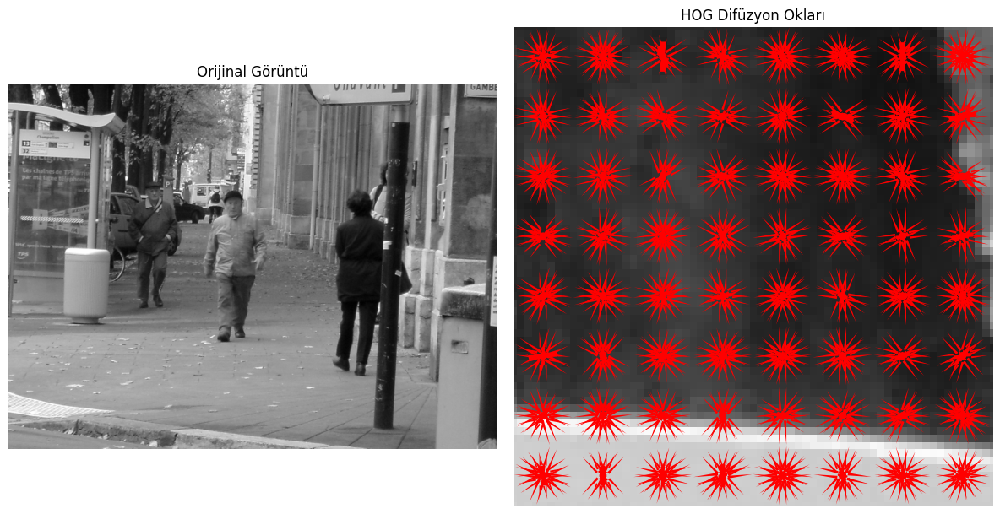

In [ ]:
img_path = "/content/crop001512.png"
img = skimage.io.imread(img_path)

# Convert to grayscale if it's a color image
if img.ndim == 3:
    img = skimage.color.rgb2gray(img)
visualize_hog(img, grad_magnitude, grad_direction, cell_size=(8, 8), num_bins=9)
plt.show()

In [45]:
# Copyright 2017 Sunkari Preetham Paul. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
################################################################################################
"""
//HOG FEATURES EXTRACTION :
Hog descriptor uses edge detection by gradient calculation and histograms of gradients,
with magnitudes as weights

The code uses [-1 0 -1] kernel for gradient magnitude and orientation calculation
Gradients are calculated in the range [0,180]
Histograms of 8 bins are calculated with magnitudes as weights
Each image is checked if its of 32X32 size, else its resized
The code reads images in greyscale.

The images are normalised for gamma, and then, for normal contrast
Each 32X32 image pixel matrix, is organised into 8X8 cells and then, histograms
are calculated for each cell. Then, a 4X4 matrix with 8 bins in each cell is obtained

This matrix is organised as 2X2 blocks(with 50% overlap) and normalised, by dividing with the
magnitude of histogram bins' vector.
A total of 9 blocks X 4 cells X 8 bins  = 288 features

"""
#################################################################################################

import os, sys
import matplotlib.pyplot as plt
import matplotlib.image as iread
import tensorflow as tf
from PIL import Image
import numpy as np

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
cwd = os.getcwd()

#for sliding window for calculating histogram
#stide = 50, incr stands for this
cell = [8, 8]
incr = [8,8]
bin_num = 8
im_size = [32,32]


#image path must be wrt current working directory
def create_array(image_path):

	image = Image.open(os.path.join(cwd,image_path)).convert('L')
	image_array = np.asarray(image,dtype=float)

	return image_array

#uses a [-1 0 1 kernel]
def create_grad_array(image_array):
	image_array = Image.fromarray(image_array)
	if not image_array.size == im_size:
		image_array = image_array.resize(im_size, resample=Image.BICUBIC)

	image_array = np.asarray(image_array,dtype=float)

	# gamma correction
	image_array = (image_array)**2.5

	# local contrast normalisation
	image_array = (image_array-np.mean(image_array))/np.std(image_array)
	max_h = 32
	max_w = 32

	grad = np.zeros([max_h, max_w])
	mag = np.zeros([max_h, max_w])
	for h,row in enumerate(image_array):
		for w, val in enumerate(row):
			if h-1>=0 and w-1>=0 and h+1<max_h and w+1<max_w:
				dy = image_array[h+1][w]-image_array[h-1][w]
				dx = row[w+1]-row[w-1]+0.0001
				grad[h][w] = np.arctan(dy/dx)*(180/np.pi)
				if grad[h][w]<0:
					grad[h][w] += 180
				mag[h][w] = np.sqrt(dy*dy+dx*dx)

	return grad,mag

def write_hog_file(filename, final_array):
	print('Saving '+filename+' ........\n')
	np.savetxt(filename,final_array)

def read_hog_file(filename):
	return np.loadtxt(filename)

def calculate_histogram(array,weights):
	bins_range = (0, 180)
	bins = bin_num
	hist,_ = np.histogram(array,bins=bins,range=bins_range,weights=weights)

	return hist

def create_hog_features(grad_array,mag_array):
	max_h = int(((grad_array.shape[0]-cell[0])/incr[0])+1)
	max_w = int(((grad_array.shape[1]-cell[1])/incr[1])+1)
	cell_array = []
	w = 0
	h = 0
	i = 0
	j = 0

	#Creating 8X8 cells
	while i<max_h:
		w = 0
		j = 0

		while j<max_w:
			for_hist = grad_array[h:h+cell[0],w:w+cell[1]]
			for_wght = mag_array[h:h+cell[0],w:w+cell[1]]

			val = calculate_histogram(for_hist,for_wght)
			cell_array.append(val)
			j += 1
			w += incr[1]

		i += 1
		h += incr[0]

	cell_array = np.reshape(cell_array,(max_h, max_w, bin_num))
	#normalising blocks of cells
	block = [2,2]
	#here increment is 1

	max_h = int((max_h-block[0])+1)
	max_w = int((max_w-block[1])+1)
	block_list = []
	w = 0
	h = 0
	i = 0
	j = 0

	while i<max_h:
		w = 0
		j = 0

		while j<max_w:
			for_norm = cell_array[h:h+block[0],w:w+block[1]]
			mag = np.linalg.norm(for_norm)
			arr_list = (for_norm/mag).flatten().tolist()
			block_list += arr_list
			j += 1
			w += 1

		i += 1
		h += 1

	#returns a vextor array list of 288 elements
	return block_list

#image_array must be an array
#returns a 288 features vector from image array
def apply_hog(image_array):
	gradient,magnitude = create_grad_array(image_array)
	hog_features = create_hog_features(gradient,magnitude)
	hog_features = np.asarray(hog_features,dtype=float)
	hog_features = np.expand_dims(hog_features,axis=0)

	return hog_features

#path must be image path
#returns final features array from image_path
def hog_from_path(image_path):
	image_array = create_array(image_path)
	final_array = apply_hog(image_array)

	return final_array

#Creates hog files
def create_hog_file(image_path,save_path):
	image_array = create_array(image_path)
	final_array = apply_hog(image_array)
	write_hog_file(save_path,final_array)

if __name__ == '__main__':
	create_hog_file('/content/crop001512.png')
	mg = read_hog_file('logo.txt')
	print(mg)
	print(mg.shape)

TypeError: create_hog_file() missing 1 required positional argument: 'save_path'

--- Test Sonuçları ---
Görüntü: /content/images.jpeg
Parametreler: Hücre=(8, 8), Blok=(2, 2), Bin=9
Çıkarılan HOG Vektör Boyutu: (26208,)


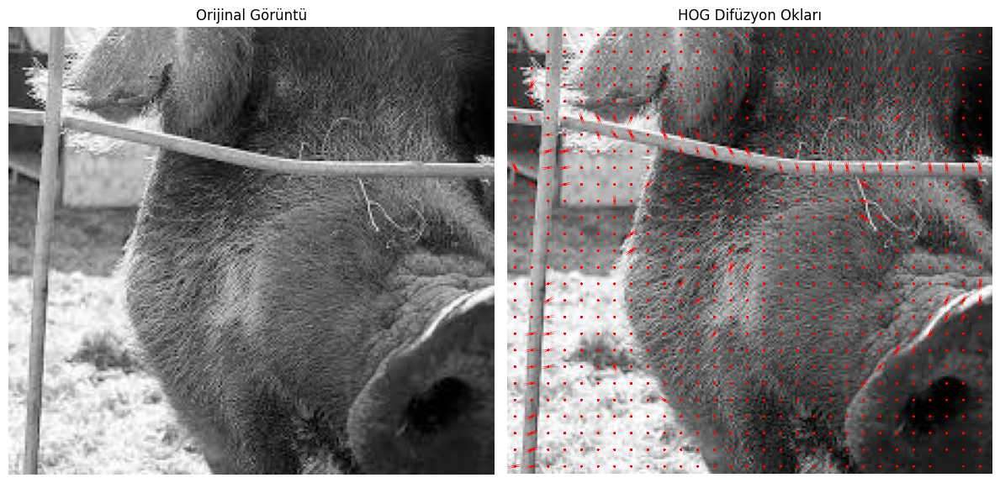

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import math
import skimage.io, skimage.color # Görüntü yükleme için gerekli

# ----------------------------------------------------
# 1. TEMEL ADIM: GRADYAN HESAPLAMA
# ----------------------------------------------------

def compute_gradients(image):
    """
    Görüntünün x (yatay) ve y (dikey) yönündeki gradyanlarını hesaplar.
    Girdi: Gri tonlamalı görüntü (numpy array)
    Çıktı: gradient_magnitude, gradient_angle (numpy arrays)
    """
    # 1. Konvolüsyon çekirdekleri ([-1, 0, 1] filtresi)
    Kx = np.array([[-1, 0, 1]]) # Yatay gradyan (Sobel operatörünün basitleştirilmiş hali)
    Ky = np.array([[-1], [0], [1]]) # Dikey gradyan

    # 2. Gradyan matrislerini hesapla (np.gradient'ten kaçınarak konvolüsyon mantığı kullanılır)
    # Bu, kenar bölgelerini sıfır kabul eden basit bir fark alma yöntemidir.

    g_col = np.empty_like(image, dtype=float) # Gx (yatay)
    g_row = np.empty_like(image, dtype=float) # Gy (dikey)

    # Dikey gradyan (Gy)
    g_row[0, :] = 0
    g_row[-1, :] = 0
    g_row[1:-1, :] = image[2:, :] - image[:-2, :]

    # Yatay gradyan (Gx)
    g_col[:, 0] = 0
    g_col[:, -1] = 0
    g_col[:, 1:-1] = image[:, 2:] - image[:, :-2]

    # 3. Büyüklük (Magnitude) ve Yön (Angle) hesapla
    gradient_magnitude = np.sqrt(g_row**2 + g_col**2)

    # arctan2 kullanılarak 4 çeyrekteki yön doğru hesaplanır
    gradient_angle = np.arctan2(g_row, g_col)
    gradient_angle = np.rad2deg(gradient_angle)

    # HOG için imzasız yön (0-180 derece) kullanılır
    gradient_angle = gradient_angle % 180

    return gradient_magnitude, gradient_angle

# ----------------------------------------------------
# 2. HÜCRE İÇİN HİSTOGRAM HESAPLAMA
# ----------------------------------------------------

def create_cell_histogram(cell_magnitude, cell_angle, num_bins=9):
    """
    Bir hücre için yönelim histogramı oluşturur (Trilinear interpolation).
    """
    HOG_hist = np.zeros(shape=(num_bins))
    bin_size = 180.0 / num_bins # Örn: 20 derece

    # Tüm piksel çiftleri üzerinde döngü
    for angle, magnitude in zip(cell_angle.flatten(), cell_magnitude.flatten()):

        # Yönü 0-180 aralığına getir (Emin olmak için tekrar)
        angle = angle % 180

        # Bin indeksini hesapla (float)
        bin_float_index = angle / bin_size

        # Birinci (daha düşük açılı) bin'in indeksi
        first_bin_idx = np.uint8(np.floor(bin_float_index))

        # İkinci (daha yüksek açılı) bin'in indeksi (döngüsel)
        second_bin_idx = (first_bin_idx + 1) % num_bins

        # İkinci bin için ağırlık (kesirli kısım)
        weight_for_second_bin = bin_float_index - first_bin_idx

        # Birinci bin için ağırlık
        weight_for_first_bin = 1.0 - weight_for_second_bin

        # Ağırlıklı oylama (magnitude ile çarpılır)
        HOG_hist[first_bin_idx] += weight_for_first_bin * magnitude
        HOG_hist[second_bin_idx] += weight_for_second_bin * magnitude

    return HOG_hist

# ----------------------------------------------------
# 3. BLOK NORMALİZASYONU
# ----------------------------------------------------

def normalize_block(block_histogram, method="L2", epsilon=1e-5):
    """
    Blok histogramını normalize eder.
    Çıktı: Normalize edilmiş histogram
    """

    if method == 'L2':
        # L2-norm: h / sqrt(||h||² + eps²)
        l2_norm_sq = np.sum(block_histogram ** 2)
        denominator = np.sqrt(l2_norm_sq + epsilon**2)
        normalized_hist = block_histogram / denominator

    elif method == 'L2-Hys':
        # 1. L2 normalizasyonu
        l2_norm_sq = np.sum(block_histogram ** 2)
        denominator = np.sqrt(l2_norm_sq + epsilon**2)
        normalized_hist = block_histogram / denominator

        # 2. Kırpma (Hysteresis)
        normalized_hist = np.minimum(normalized_hist, 0.2)

        # 3. Yeniden L2 normalizasyonu
        l2_norm_sq_hys = np.sum(normalized_hist ** 2)
        denominator_hys = np.sqrt(l2_norm_sq_hys + epsilon**2)
        normalized_hist = normalized_hist / denominator_hys

    else:
        # L1 ve L1-sqrt opsiyonları da burada eklenebilir.
        raise ValueError(f"Bilinmeyen normalizasyon metodu: {method}")

    return normalized_hist


# ----------------------------------------------------
# 4. TAM HOG DESCRIPTOR HESAPLAMA
# ----------------------------------------------------

def compute_hog_descriptor(image, cell_size=(8, 8), block_size=(2, 2), num_bins=9):
    """
    Tam HOG descriptor vektörünü hesaplar (Sliding Window ile blokları tara).
    """
    mag, angle = compute_gradients(image)
    img_h, img_w = mag.shape
    cell_h, cell_w = cell_size
    block_h, block_w = block_size

    # Hücre ızgarası boyutları
    n_cells_row = img_h // cell_h
    n_cells_col = img_w // cell_w

    # Blok ızgarası boyutları (1 hücre kaymalı Sliding Window)
    n_blocks_row = n_cells_row - block_h + 1
    n_blocks_col = n_cells_col - block_w + 1

    if n_blocks_row <= 0 or n_blocks_col <= 0:
         raise ValueError("Görüntü çok küçük.")

    block_descriptor_size = block_h * block_w * num_bins
    hog_descriptor = []

    # Tüm hücreler için histogramları hesapla ve bellekte tut
    cell_histograms = np.zeros((n_cells_row, n_cells_col, num_bins))

    for r in range(n_cells_row):
        for c in range(n_cells_col):
            r_start, r_end = r * cell_h, (r + 1) * cell_h
            c_start, c_end = c * cell_w, (c + 1) * cell_w

            cell_mag = mag[r_start:r_end, c_start:c_end]
            cell_angle = angle[r_start:r_end, c_start:c_end]

            cell_histograms[r, c, :] = create_cell_histogram(cell_mag, cell_angle, num_bins)

    # Blokları tara ve normalize et (Sliding Window)
    for br in range(n_blocks_row):
        for bc in range(n_blocks_col):

            # Bloğun kapsadığı hücrelerin histogramlarını seç (Örn: 2x2 hücre)
            block_hists = cell_histograms[br:br + block_h, bc:bc + block_w, :]

            # 1D vektöre birleştir (Örn: 2*2*9 = 36 boyutlu)
            block_vector = block_hists.flatten()

            # Normalize et (Varsayılan: L2-Hys)
            normalized_block = normalize_block(block_vector, method="L2-Hys")

            # Ana HOG listesine ekle
            hog_descriptor.extend(normalized_block)

    return np.array(hog_descriptor)

# ----------------------------------------------------
# 5. HOG GÖRSELLEŞTİRME
# ----------------------------------------------------

def visualize_hog(image, cell_size=(8, 8), num_bins=9):
    """
    HOG özelliklerini görsel olarak gösterir (Difüzyon Okları).
    Gereksinim: cv2.line yerine Matplotlib'in quiver'ı kullanılır.
    """
    mag, angle = compute_gradients(image)
    img_h, img_w = mag.shape
    cell_h, cell_w = cell_size

    n_cells_row = img_h // cell_h
    n_cells_col = img_w // cell_w

    bin_size = 180.0 / num_bins
    hist_bins = np.arange(num_bins) * bin_size + (bin_size / 2) # Merkezi açılar

    # 1. Hücre histogramlarını hesapla
    cell_histograms = np.zeros((n_cells_row, n_cells_col, num_bins))
    for r in range(n_cells_row):
        for c in range(n_cells_col):
            r_start, r_end = r * cell_h, (r + 1) * cell_h
            c_start, c_end = c * cell_w, (c + 1) * cell_w

            cell_mag = mag[r_start:r_end, c_start:c_end]
            cell_angle = angle[r_start:r_end, c_start:c_end]
            cell_histograms[r, c, :] = create_cell_histogram(cell_mag, cell_angle, num_bins)

    # 2. Ok çizimi için verileri hazırla
    X_pos, Y_pos, U, V = [], [], [], []
    max_hist_val = np.max(cell_histograms)

    # Ölçeklendirme faktörü: Ok uzunluğunu hücre boyutunun yarısı civarında tutar
    # Bu, aşırı büyük oklar çizilmesini engeller
    scale_factor = 0.4 * cell_h / (max_hist_val + 1e-6)

    for r in range(n_cells_row):
        for c in range(n_cells_col):
            center_x = c * cell_w + cell_w / 2
            center_y = r * cell_h + cell_h / 2

            hist = cell_histograms[r, c, :]

            for bin_idx in range(num_bins):
                magnitude = hist[bin_idx]
                if magnitude > 0.01 * max_hist_val: # Çok zayıf oyları ihmal et

                    angle_deg = hist_bins[bin_idx]
                    angle_rad = np.deg2rad(angle_deg)

                    length = magnitude * scale_factor

                    # Okun X ve Y bileşenleri (dx, dy)
                    u_comp = length * np.cos(angle_rad)
                    v_comp = length * np.sin(angle_rad)

                    # Merkezden yayılma (çift çizgi, HOG imzasız yön)
                    X_pos.extend([center_x, center_x])
                    Y_pos.extend([center_y, center_y])
                    U.extend([u_comp, -u_comp])
                    V.extend([v_comp, -v_comp])

    # 3. Görselleştirme
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Orijinal Görüntü
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title("Orijinal Görüntü")
    axes[0].axis('off')

    # HOG Görselleştirmesi
    axes[1].imshow(image, cmap='gray')
    axes[1].set_title("HOG Difüzyon Okları")

    axes[1].quiver(X_pos, Y_pos, U, V,
                   color='red',
                   scale=1.0,
                   units='xy',
                   pivot='middle',
                   width=1.0,
                   headwidth=0, headlength=0) # Çizgi (oksuz) çizer

    # Koordinat sistemini görüntüye uydur
    axes[1].set_ylim(img_h, 0)
    axes[1].set_xlim(0, img_w)
    axes[1].set_aspect('equal', adjustable='box')
    axes[1].axis('off')

    plt.tight_layout()
    return fig

# ----------------------------------------------------
# 6. TEST VE ÇALIŞTIRMA BLOĞU
# ----------------------------------------------------

def run_hog_test(image_path, cell_size=(8, 8), block_size=(2, 2), num_bins=9):
    """Verilen parametrelerle HOG'u çalıştırır ve sonuçları yazdırır."""
    try:
        # 1. Görüntüyü Yükle ve Griye Çevir
        img = skimage.io.imread(image_path)
        if img.ndim == 3:
            img_gray = skimage.color.rgb2gray(img)
        else:
            img_gray = img

        # 2. HOG Hesabı
        hog_vector = compute_hog_descriptor(img_gray,
                                            cell_size=cell_size,
                                            block_size=block_size,
                                            num_bins=num_bins)

        # 3. Sonuçları Yazdır
        print("--- Test Sonuçları ---")
        print(f"Görüntü: {image_path}")
        print(f"Parametreler: Hücre={cell_size}, Blok={block_size}, Bin={num_bins}")
        print(f"Çıkarılan HOG Vektör Boyutu: {hog_vector.shape}")

        # 4. Görselleştirme
        fig = visualize_hog(img_gray, cell_size=cell_size, num_bins=num_bins)
        return fig

    except FileNotFoundError:
        print(f"Hata: Dosya bulunamadı: {image_path}")
    except ValueError as e:
        print(f"Hata: {e}")

# # --- Örnek Çalıştırma (Kendi görüntü yollarınızla değiştirin) ---
# # Not: Bu kodun çalışması için test görüntülerini yüklemiş olmanız gerekir.

# # Test 1: Basit Şekil
# run_hog_test("test_square.png", cell_size=(10, 10))

# # Test 2: Gerçek Nesne
run_hog_test("/content/images.jpeg")  # bu ekranda gösterir
plt.draw()                             # figürü kapatmaz
plt.savefig("hog_output.png")          # şimdi kaydedilir


# # Test 3: Farklı Parametre
# run_hog_test("test_silhoutte.png", cell_size=(16, 16), num_bins=6)


In [48]:
def run_multiple_hog_tests(image_path):
    """
    Farklı parametrelerle HOG testlerini otomatik olarak çalıştırır.
    Her bir sonucu ayrı PNG olarak kaydeder.
    """
    tests = [
        # (cell_size, block_size, num_bins)
        ((8, 8),   (2, 2), 9),
        ((16, 16), (2, 2), 9),
        ((8, 8),   (3, 3), 9),
        ((8, 8),   (2, 2), 6),
        ((4, 4),   (2, 2), 9),
    ]

    for i, (cell, block, bins) in enumerate(tests):
        print(f"\n--- Test {i+1} ---")
        print(f"cell={cell}, block={block}, num_bins={bins}")

        # Çıktıyı figür olarak al
        fig = run_hog_test(image_path,
                           cell_size=cell,
                           block_size=block,
                           num_bins=bins)

        # Kaydet
        filename = f"hog_output_test_{i+1}_cell{cell}_block{block}_bins{bins}.png"
        fig.savefig(filename)
        print(f"KAYDEDİLDİ → {filename}")
        plt.close(fig)


In [49]:
run_multiple_hog_tests("/content/images.jpeg")



--- Test 1 ---
cell=(8, 8), block=(2, 2), num_bins=9
--- Test Sonuçları ---
Görüntü: /content/images.jpeg
Parametreler: Hücre=(8, 8), Blok=(2, 2), Bin=9
Çıkarılan HOG Vektör Boyutu: (26208,)
KAYDEDİLDİ → hog_output_test_1_cell(8, 8)_block(2, 2)_bins9.png

--- Test 2 ---
cell=(16, 16), block=(2, 2), num_bins=9
--- Test Sonuçları ---
Görüntü: /content/images.jpeg
Parametreler: Hücre=(16, 16), Blok=(2, 2), Bin=9
Çıkarılan HOG Vektör Boyutu: (5616,)
KAYDEDİLDİ → hog_output_test_2_cell(16, 16)_block(2, 2)_bins9.png

--- Test 3 ---
cell=(8, 8), block=(3, 3), num_bins=9
--- Test Sonuçları ---
Görüntü: /content/images.jpeg
Parametreler: Hücre=(8, 8), Blok=(3, 3), Bin=9
Çıkarılan HOG Vektör Boyutu: (54675,)
KAYDEDİLDİ → hog_output_test_3_cell(8, 8)_block(3, 3)_bins9.png

--- Test 4 ---
cell=(8, 8), block=(2, 2), num_bins=6
--- Test Sonuçları ---
Görüntü: /content/images.jpeg
Parametreler: Hücre=(8, 8), Blok=(2, 2), Bin=6
Çıkarılan HOG Vektör Boyutu: (17472,)
KAYDEDİLDİ → hog_output_test_4_cell

In [50]:
###insan sınıflandırma

import numpy as np
from skimage import transform #görüntüleri yeniden boyutlandırma kaydırma döndürme
from skimage.transform import pyramid_gaussian #görüntü piramitleri oluşturur
from imutils.object_detection import non_max_suppression #bounding box, birbirine çok yakın kutuları birleştiri
import imutils #image için utils (yardımcı fonklar)
from skimage.feature import hog #özellik çıkarımı, şekil ve kenar bilgisi
from joblib import load #eğitilmiş modeli kaydetmek ve yüklemek. (.pkl)
import cv2
from skimage import color #renk uzayında dönüşümler
import matplotlib.pyplot as plt
import os
import glob #belirli bir klasördeki ddosyaları listleemk için kullanılır

In [51]:
pos_im_path = "pos_person" #insan olan görüntüler
neg_im_path = "neg_person" #insan olmayan görüntüler
min_wdw_sz = [64,128] #bounding box boyutu
step_size = [10,10] #bounding box kaç piksel sağ sol aşağı yukarı kaysın
orientations = 9 #bin size 10,30,50,...170
pixels_per_cell = [6,6] #hog için görüntü içerisinde seçileceği piksel, genelde (10,10) ama daha hassas çalışmak istiyoruz.
cells_per_block = [2,2] #blok normalizasyonu için bloğun size
visualize = False #model eğitilirken görselleştime olmasın
normalize = True
pos_feat_ph = "pos" #çıktısı pozitif olanlar bu klasöre
neg_feat_ph = "neg" #negatif olanlar bu klasöre kaydedilsin
model_path = "models" #model bu yola kaydedilsin
threshold = .3 #0.3 den büyük ise insan küçük ise değil

In [ ]:
def sliding_window(image, window_size, step_size):
  for y in range(0, image.shape[0],step_size[1]):
    for x in range(0, image.shape[1],step_size[0]):
      yield (x,y,image[y: y + window_size[1], x:x+window_size[0]])
      #görüntüyü küçük pencerelere bölüyor. her bir adımda pencere 10 adım kaydırılıyor. her durumda 64*128'lik bir pencere oluşturuluyor
      #yield her pencereyi sırayla veriyoor

def detector(filename):
  im = cv2.imread(filename)
  im = imutils.resize(im, width = min(400, im.shape[1])) #400*y lik görüntüye yeniden ölçekle
  min_wdw_sz = (64, 128)
  step_size = (10,10)
  downscale = 1.6 #piramit için küçültme oranı

  clf = joblib.load(os.path.jon(model_path, 'svm.modlel')) #daha önce eğtilmiş svm modeli çağırıyor

  detections = []

  scale = 0
  """piramitin içine koyduğumuz şekil scale'in üssel azalmasıyla
  önce gray yapılır sonra hog algoritmasına sokulur
  sonra yeniden ölçeklendirilir (?)
  en sonunda svm algoritmasına verilir"""
  for im_scaled in pyramid_gaussian(im, downscale = downscale):
    if im_scaled.shape[0] < min_wdw_sz[1] or im_scaled.shape[1] < min_wdw_sz[0]:
      break
    for (x,y,im_window) in sliding_window(im_scaled, min_wdw_sz, step_size):
      if im_window.shape[0] != min_wdw_sz[1] or im_window.shape[1]!=min_wdw_sz[0]:
        continue
      im_window = color.rgb2gray(im_window)
      fd = hog(im_window, orientations = 9, picels_per_cell=(6,6), cells_per_block=(2,2), block_norm='L1',
               visualise = False,
               transform_sqrt =False,
               feature_vector = True,
               normalise=None)
      #hogların sonucu genelde 1 boyutlu vektör olarak gelir.
      #decision_function ve predickt 2D array bekler(örnek sayısı, özellik sayısı)
      #(1,3670): tek örnek, 3670 özellik
      fd = fd.reshape(1,-1)
      pred = clf.predict(fd)

      if pred ==1: #insan dedi diyelim
       #decision_function: güven skoru of svö
        if clf.decision_function(fd) > 0.5:
          detections.append((int(x * (downscale**scale)), int(y * (downscale**scale)), clf.decision_function(fd), int(min_wdw_sz[0] * (downscale**scale)),int(min_wdw_sz[1] * (downscale**scale))))
    scale+=1
  clone = im.copy()

  rects = np.array([[x,y,x+w, y+h] for (x,y,_,w,h) in detections])
  #verideki her karenin en sol köşesi ile en alt sol köşesi alınıyor. (0,0) olsun mesela sağ alt (64,128 olur)
  #bu değer non_max_suppresion2ın bounding box yapmasını sağlayacak
  sc = [score[0] for (x,y,score,w,h) in detections] #her pencere içindeki skora bakıyor
  pick = non_max_suppression(rects, probs = sc, overlapTresh = 0.3) #bu skorlardan en yükseğini seçiyor.
  #mesela pencere 12in skoru: 0.9, p2 sc : 0.85, p3 sc: 0.6, pencere1'i seçti

  for (x_tl, y_tl,_,w,h) in detections:
    cv2.rectangle(im, (x_tl,y_tl), (x_tl+w, y_tl+h), (0,255,0), thickness = 2)
  for (xA, yA, xB, yB) in pick:
    cv2.rectangle(clone,(xA,yA),(xB,yB),(0,255,0),2)
  scale_percent=70
  w=clone.shape[1]
  h=clone.shape[0]
  width = int(w * scale_percent / 100)
  height = int(h * scale_percent / 100)
  dim = (width, height)
  resized = cv2.resize(
          clone, dim, interpolation=cv2.INTER_AREA)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
  plt.title("Raw Detection before NMS")
  plt.show()

  plt.axis("off")
  plt.imshow(cv2.cvtColor(clone, cv2.COLOR_BGR2RGB))
  plt.title("Final Detections after applying NMS")
  plt.show()





def test_folder(foldername):

    filenames = glob.glob(os.path.join(foldername, '*'))
    for filename in filenames:
        detector(filename)




int(x * (downscale**scale)) → pencerenin orijinal görüntüdeki x koordinatı

int(y * (downscale**scale)) → pencerenin orijinal görüntüdeki y koordinatı

clf.decision_function(fd) → pencerenin SVM güven skoru

int(min_wdw_sz[0] * (downscale**scale)) → pencerenin genişliği (ölçeklenmiş)

int(min_wdw_sz[1] * (downscale**scale)) → pencerenin yüksekliği (ölçeklenmiş)

Not: downscale**scale → görüntü piramidi ile küçültülen pencereyi orijinal görüntüye geri ölçeklendirme.

In [ ]:
import os
import glob
import cv2
import numpy as np
from skimage.feature import hog
from skimage.color import rgb2gray
from imutils.object_detection import non_max_suppression
from skimage.transform import pyramid_gaussian
import matplotlib.pyplot as plt
import joblib

# ----------------------------
# Konfigürasyon
# ----------------------------
WINDOW_SIZE = (64, 128)
STEP_SIZE = (10, 10)
ORIENTATIONS = 9
PIXELS_PER_CELL = (6, 6)
CELLS_PER_BLOCK = (2, 2)
DOWNSCALE = 1.6
THRESHOLD = 0.5

MODEL_PATH = r'C:\Users\Richa Agrawal\Desktop\computer vision\video\re-svm\data\models\svm.model'

# ----------------------------
# Fonksiyonlar
# ----------------------------
def sliding_window(image, step_size, window_size):
    """Görüntü üzerinde kayan pencere ile gezinti"""
    for y in range(0, image.shape[0] - window_size[1] + 1, step_size[1]):
        for x in range(0, image.shape[1] - window_size[0] + 1, step_size[0]):
            yield (x, y, image[y:y + window_size[1], x:x + window_size[0]])

def compute_hog_features(image):
    """HOG özelliklerini çıkarır ve SVM uyumlu hale getirir"""
    gray = rgb2gray(image)
    features = hog(gray,
                   orientations=ORIENTATIONS,
                   pixels_per_cell=PIXELS_PER_CELL,
                   cells_per_block=CELLS_PER_BLOCK,
                   block_norm='L2-Hys',
                   transform_sqrt=True,
                   feature_vector=True)
    return features.reshape(1, -1)

def detect_people(image, classifier):
    """Bir görüntüde insanları tespit eder ve koordinatlarını döner"""
    detections = []
    scale = 0

    for resized in pyramid_gaussian(image, downscale=DOWNSCALE):
        if resized.shape[0] < WINDOW_SIZE[1] or resized.shape[1] < WINDOW_SIZE[0]:
            break

        for x, y, window in sliding_window(resized, STEP_SIZE, WINDOW_SIZE):
            if window.shape[0] != WINDOW_SIZE[1] or window.shape[1] != WINDOW_SIZE[0]:
                continue

            features = compute_hog_features(window)
            pred = classifier.predict(features)
            score = classifier.decision_function(features)

            if pred == 1 and score > THRESHOLD:
                # Orijinal boyuta ölçekle
                detections.append((
                    int(x * (DOWNSCALE ** scale)),
                    int(y * (DOWNSCALE ** scale)),
                    score,
                    int(WINDOW_SIZE[0] * (DOWNSCALE ** scale)),
                    int(WINDOW_SIZE[1] * (DOWNSCALE ** scale))
                ))
        scale += 1

    return detections

def apply_nms(detections):
    """Non-Maximum Suppression uygular"""
    rects = np.array([[x, y, x + w, y + h] for x, y, _, w, h in detections])
    scores = np.array([score[0] for _, _, score, _, _ in detections])
    pick = non_max_suppression(rects, probs=scores, overlapThresh=0.3)
    return pick

def visualize_detections(image, detections):
    """Tespitleri görselleştirir"""
    for x1, y1, x2, y2 in detections:
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

def process_folder(folder_path, classifier):
    """Klasördeki tüm görüntüleri işler"""
    for file_path in glob.glob(os.path.join(folder_path, '*.*')):
        image = cv2.imread(file_path)
        detections = detect_people(image, classifier)
        nms_detections = apply_nms(detections)
        visualize_detections(image.copy(), nms_detections)

# ----------------------------
# Ana Program
# ----------------------------
if __name__ == "__main__":
    svm_model = joblib.load(MODEL_PATH)
    TEST_FOLDER = r'C:\Users\Richa Agrawal\Desktop\computer vision\video\re-svm\object_detector\test_image'
    process_folder(TEST_FOLDER, svm_model)


In [ ]:
import os
import glob
import cv2
import numpy as np
from skimage.feature import hog
from skimage.color import rgb2gray
from imutils.object_detection import non_max_suppression
from skimage.transform import pyramid_gaussian
import matplotlib.pyplot as plt
import joblib

# -----------------------------
# 1️⃣ Konfigürasyon ve Parametreler
# -----------------------------
POS_PATH = r"C:\Users\Richa Agrawal\Desktop\computer vision\video\re-svm\data\images\pos_person"
NEG_PATH = r"C:\Users\Richa Agrawal\Desktop\computer vision\video\re-svm\data\images\neg_person"
MODEL_SAVE_PATH = r"C:\Users\Richa Agrawal\Desktop\computer vision\video\re-svm\data\models\svm_hog_model.dat"
TEST_FOLDER = r'C:\Users\Richa Agrawal\Desktop\computer vision\video\re-svm\object_detector\test_image'

WINDOW_SIZE = (64, 128)
STEP_SIZE = (10, 10)
ORIENTATIONS = 9
PIXELS_PER_CELL = (6, 6)
CELLS_PER_BLOCK = (2, 2)
DOWNSCALE = 1.6
THRESHOLD = 0.5

HOG_PARAMS = {
    'orientations': ORIENTATIONS,
    'pixels_per_cell': PIXELS_PER_CELL,
    'cells_per_block': CELLS_PER_BLOCK,
    'block_norm': 'L2-Hys',
    'transform_sqrt': True,
    'feature_vector': True
}

# -----------------------------
# 2️⃣ HOG Özelliklerini Çıkarma Fonksiyonu
# -----------------------------
def extract_hog_features(image_paths, label):
    features = []
    labels = []
    for path in image_paths:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        hog_feat = hog(img, **HOG_PARAMS)
        features.append(hog_feat)
        labels.append(label)
    return features, labels

# -----------------------------
# 3️⃣ Veri Hazırlama
# -----------------------------
def prepare_dataset():
    pos_files = glob.glob(os.path.join(POS_PATH, "*.png")) + glob.glob(os.path.join(POS_PATH, "*.jpg"))
    neg_files = glob.glob(os.path.join(NEG_PATH, "*.png")) + glob.glob(os.path.join(NEG_PATH, "*.jpg"))

    pos_features, pos_labels = extract_hog_features(pos_files, 1)
    neg_features, neg_labels = extract_hog_features(neg_files, 0)

    X = np.array(pos_features + neg_features, dtype=np.float32)
    y = np.array(pos_labels + neg_labels, dtype=np.int32)

    # Shuffle dataset
    indices = np.random.permutation(len(X))
    X = X[indices]
    y = y[indices]

    return X, y

# -----------------------------
# 4️⃣ SVM Eğitimi
# -----------------------------
def train_svm(X, y):
    svm = cv2.ml.SVM_create()
    svm.setType(cv2.ml.SVM_C_SVC)
    svm.setKernel(cv2.ml.SVM_RBF)
    svm.setGamma(0.5)
    svm.setC(2.0)

    svm.train(X, cv2.ml.ROW_SAMPLE, y)
    print("SVM training completed.")
    print(f"Support vectors count: {svm.getSupportVectors().shape[0]}")

    svm.save(MODEL_SAVE_PATH)
    print(f"Model saved to: {MODEL_SAVE_PATH}")
    return svm

# -----------------------------
# 5️⃣ Kayan Pencere Fonksiyonu
# -----------------------------
def sliding_window(image, step_size, window_size):
    for y in range(0, image.shape[0] - window_size[1] + 1, step_size[1]):
        for x in range(0, image.shape[1] - window_size[0] + 1, step_size[0]):
            yield (x, y, image[y:y + window_size[1], x:x + window_size[0]])

# -----------------------------
# 6️⃣ HOG Özelliklerini Hesaplama
# -----------------------------
def compute_hog_features(image):
    gray = rgb2gray(image)
    features = hog(gray, **HOG_PARAMS)
    return features.reshape(1, -1)

# -----------------------------
# 7️⃣ İnsan Tespiti
# -----------------------------
def detect_people(image, classifier):
    detections = []
    scale = 0

    for resized in pyramid_gaussian(image, downscale=DOWNSCALE):
        if resized.shape[0] < WINDOW_SIZE[1] or resized.shape[1] < WINDOW_SIZE[0]:
            break

        for x, y, window in sliding_window(resized, STEP_SIZE, WINDOW_SIZE):
            if window.shape[0] != WINDOW_SIZE[1] or window.shape[1] != WINDOW_SIZE[0]:
                continue

            features = compute_hog_features(window)
            pred = classifier.predict(features)
            score = classifier.decision_function(features)

            if pred == 1 and score > THRESHOLD:
                detections.append((
                    int(x * (DOWNSCALE ** scale)),
                    int(y * (DOWNSCALE ** scale)),
                    score,
                    int(WINDOW_SIZE[0] * (DOWNSCALE ** scale)),
                    int(WINDOW_SIZE[1] * (DOWNSCALE ** scale))
                ))
        scale += 1
    return detections

# -----------------------------
# 8️⃣ Non-Maximum Suppression
# -----------------------------
def apply_nms(detections):
    rects = np.array([[x, y, x + w, y + h] for x, y, _, w, h in detections])
    scores = np.array([score[0] for _, _, score, _, _ in detections])
    pick = non_max_suppression(rects, probs=scores, overlapThresh=0.3)
    return pick

# -----------------------------
# 9️⃣ Tespitleri Görselleştirme
# -----------------------------
def visualize_detections(image, detections):
    for x1, y1, x2, y2 in detections:
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

# -----------------------------
# 10️⃣ Klasördeki Görüntüleri İşleme
# -----------------------------
def process_folder(folder_path, classifier):
    for file_path in glob.glob(os.path.join(folder_path, '*.*')):
        image = cv2.imread(file_path)
        detections = detect_people(image, classifier)
        nms_detections = apply_nms(detections)
        visualize_detections(image.copy(), nms_detections)

# -----------------------------
# 11️⃣ Ana Program
# -----------------------------
if __name__ == "__main__":
    # 1️⃣ Eğitim
    X, y = prepare_dataset()
    svm_model = train_svm(X, y)

    # 2️⃣ Test
    process_folder(TEST_FOLDER, svm_model)


İşleniyor: /content/drive/MyDrive/human/1/68.png
  -> 1 insan tespit edildi.


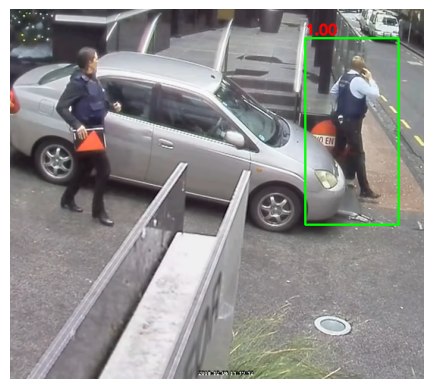

İşleniyor: /content/drive/MyDrive/human/1/71.png
  -> 2 insan tespit edildi.


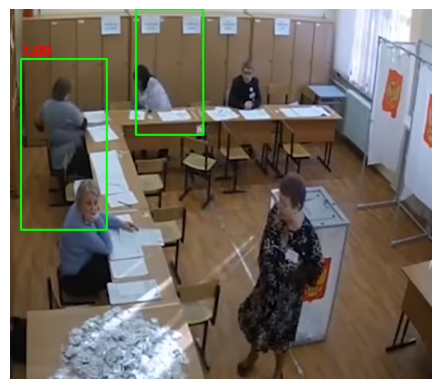

İşleniyor: /content/drive/MyDrive/human/1/77.png
  -> 1 insan tespit edildi.


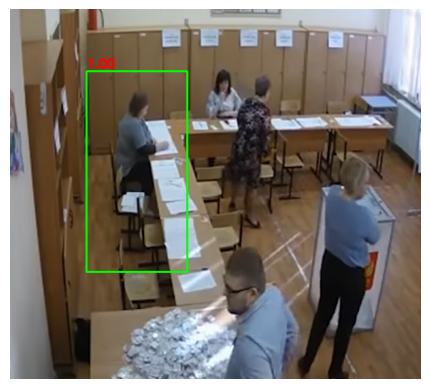

İşleniyor: /content/drive/MyDrive/human/1/56.png
  -> 1 insan tespit edildi.


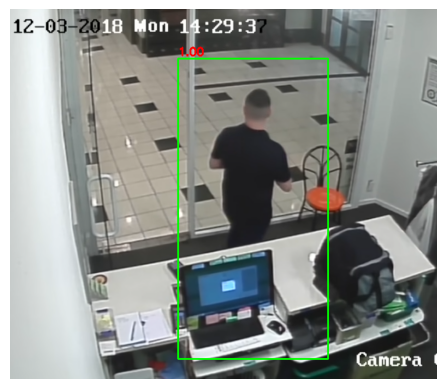

İşleniyor: /content/drive/MyDrive/human/1/67.png
  -> 1 insan tespit edildi.


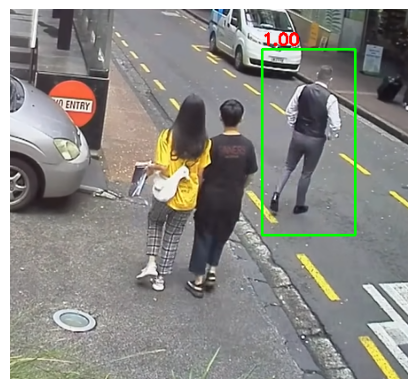

İşleniyor: /content/drive/MyDrive/human/1/72.png
  -> 1 insan tespit edildi.


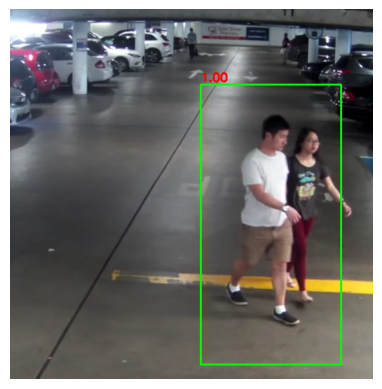

İşleniyor: /content/drive/MyDrive/human/1/70.png
  -> 1 insan tespit edildi.


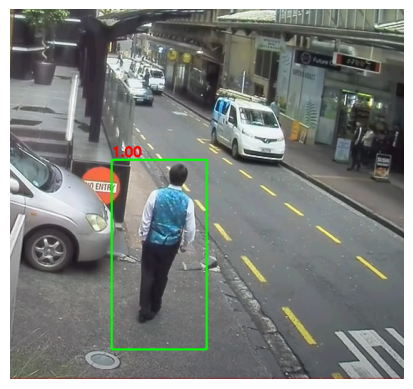

İşleniyor: /content/drive/MyDrive/human/1/64.png
  -> 1 insan tespit edildi.


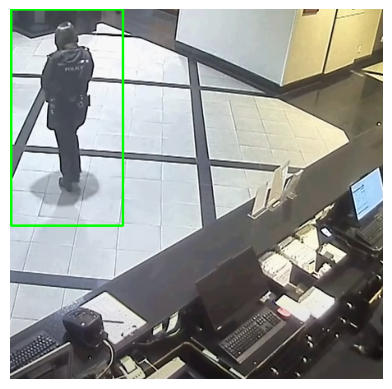

İşleniyor: /content/drive/MyDrive/human/1/63.png
  -> 1 insan tespit edildi.


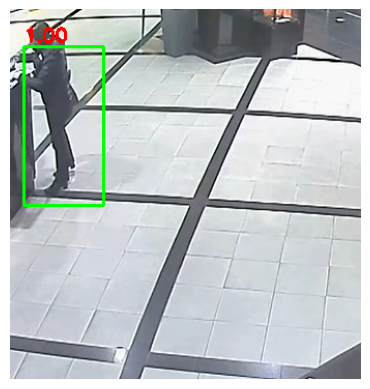

İşleniyor: /content/drive/MyDrive/human/1/66.png
  -> 2 insan tespit edildi.


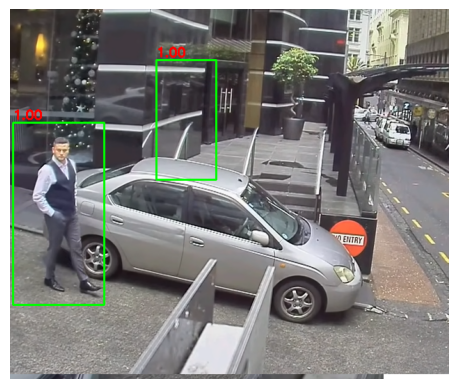

İşleniyor: /content/drive/MyDrive/human/1/61.png
  -> 2 insan tespit edildi.


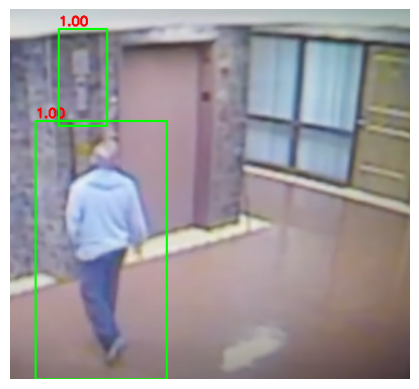

İşleniyor: /content/drive/MyDrive/human/1/76.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/54.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/73.png
  -> 2 insan tespit edildi.


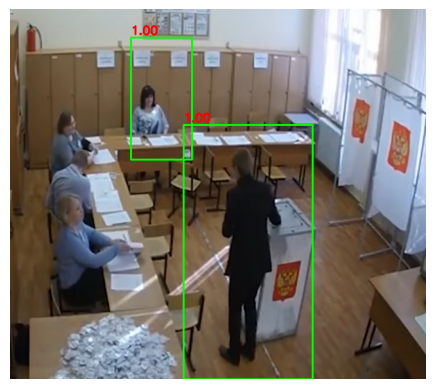

İşleniyor: /content/drive/MyDrive/human/1/75.png
  -> 1 insan tespit edildi.


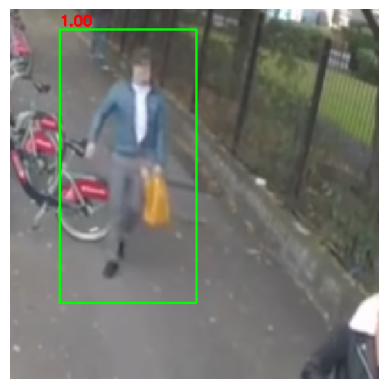

İşleniyor: /content/drive/MyDrive/human/1/57.png
  -> 2 insan tespit edildi.


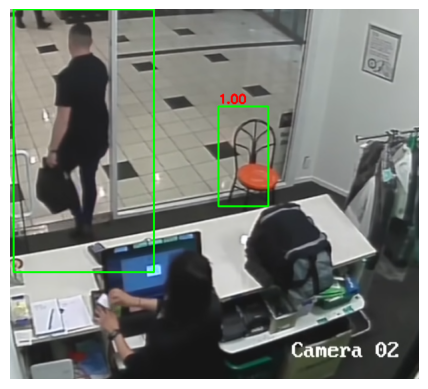

İşleniyor: /content/drive/MyDrive/human/1/60.png
  -> 2 insan tespit edildi.


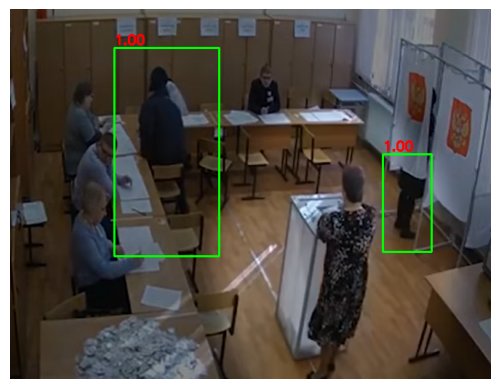

İşleniyor: /content/drive/MyDrive/human/1/62.png
  -> 1 insan tespit edildi.


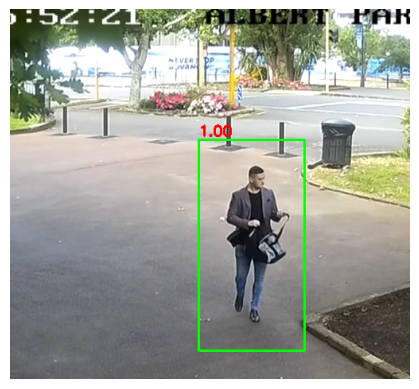

İşleniyor: /content/drive/MyDrive/human/1/55.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/69.png
  -> 2 insan tespit edildi.


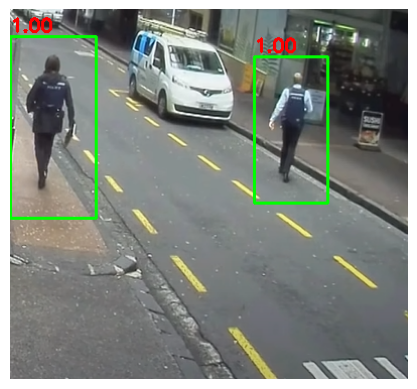

İşleniyor: /content/drive/MyDrive/human/1/6.png
  -> 1 insan tespit edildi.


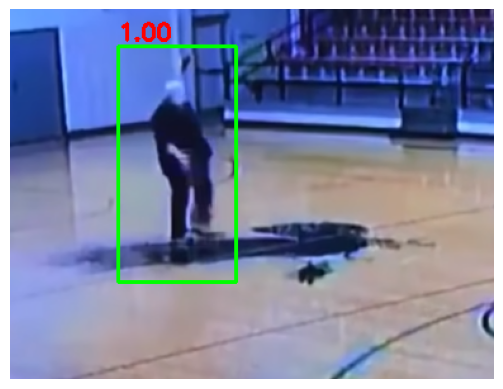

İşleniyor: /content/drive/MyDrive/human/1/7.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/65.png
  -> 2 insan tespit edildi.


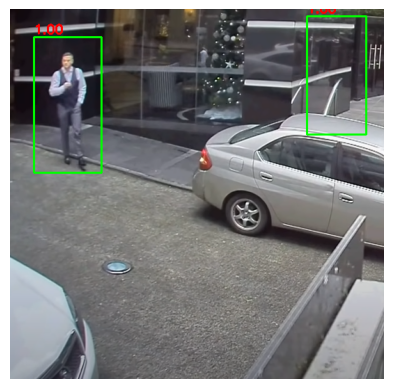

İşleniyor: /content/drive/MyDrive/human/1/59.png
  -> 1 insan tespit edildi.


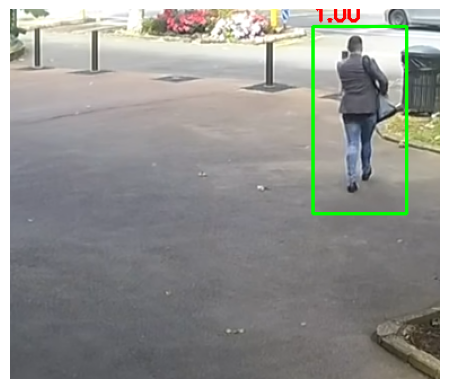

İşleniyor: /content/drive/MyDrive/human/1/58.png
  -> 1 insan tespit edildi.


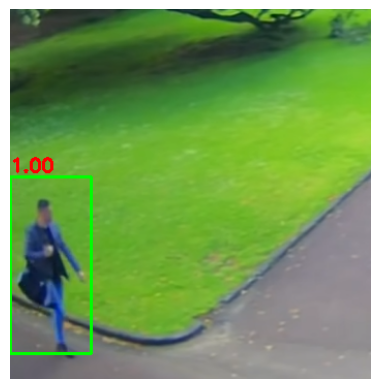

İşleniyor: /content/drive/MyDrive/human/1/74.png
  -> 2 insan tespit edildi.


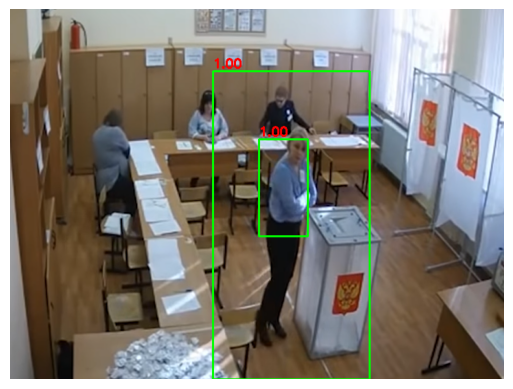

İşleniyor: /content/drive/MyDrive/human/1/90.png
  -> 1 insan tespit edildi.


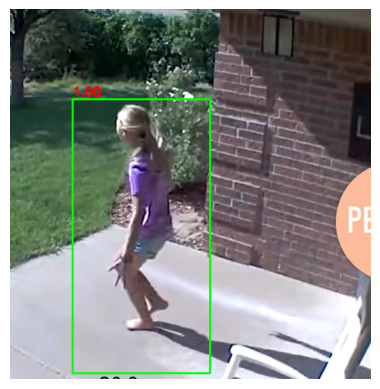

İşleniyor: /content/drive/MyDrive/human/1/82.png
  -> 2 insan tespit edildi.


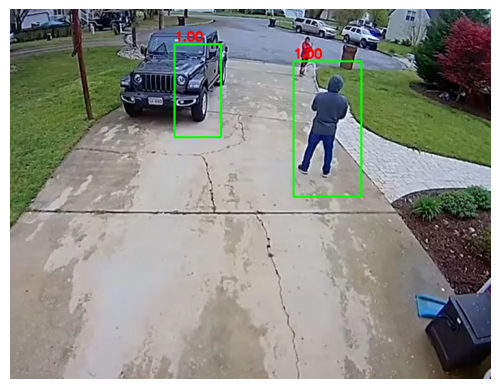

İşleniyor: /content/drive/MyDrive/human/1/8.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/88.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/89.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/95.png
  -> 1 insan tespit edildi.


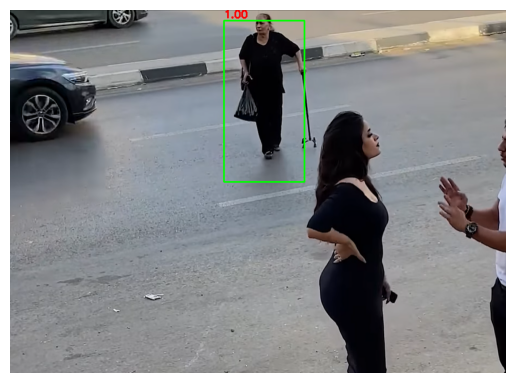

İşleniyor: /content/drive/MyDrive/human/1/80.png
  -> 1 insan tespit edildi.


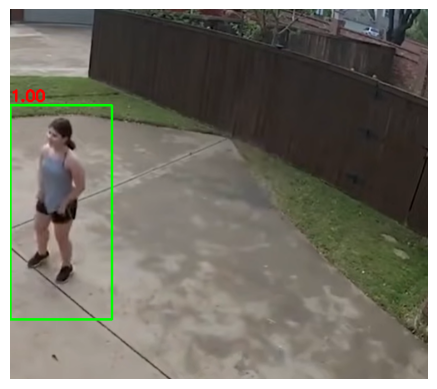

İşleniyor: /content/drive/MyDrive/human/1/98.png
  -> 1 insan tespit edildi.


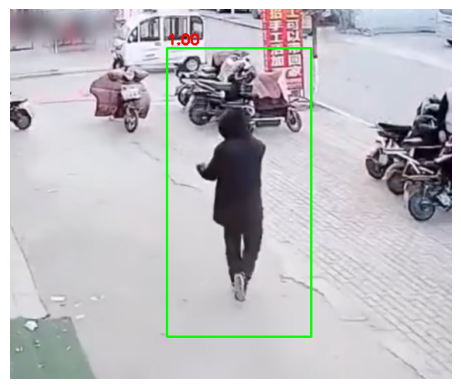

İşleniyor: /content/drive/MyDrive/human/1/85.png
  -> 1 insan tespit edildi.


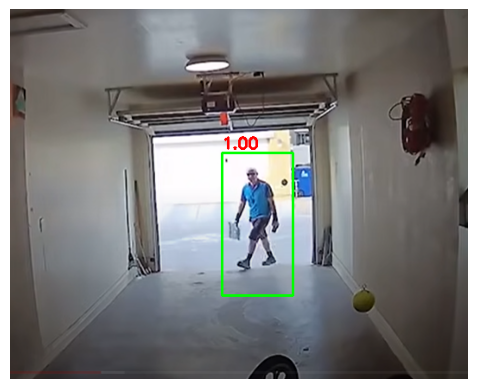

İşleniyor: /content/drive/MyDrive/human/1/93.png
  -> 2 insan tespit edildi.


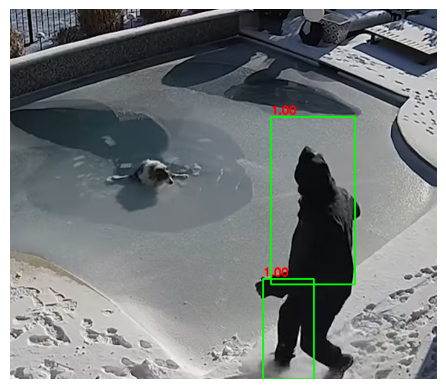

İşleniyor: /content/drive/MyDrive/human/1/92.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/84.png
  -> 1 insan tespit edildi.


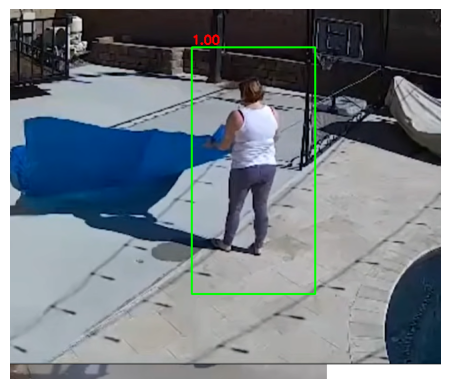

İşleniyor: /content/drive/MyDrive/human/1/91.png
  -> 2 insan tespit edildi.


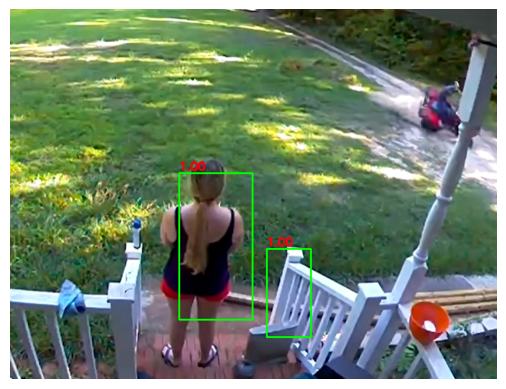

İşleniyor: /content/drive/MyDrive/human/1/9.png
  -> 1 insan tespit edildi.


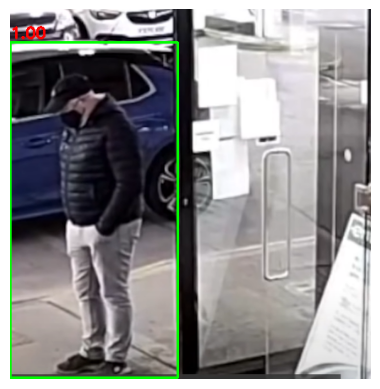

İşleniyor: /content/drive/MyDrive/human/1/96.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/94.png
  -> 1 insan tespit edildi.


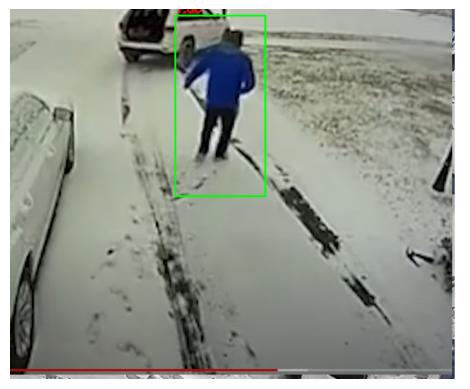

İşleniyor: /content/drive/MyDrive/human/1/81.png
  -> 1 insan tespit edildi.


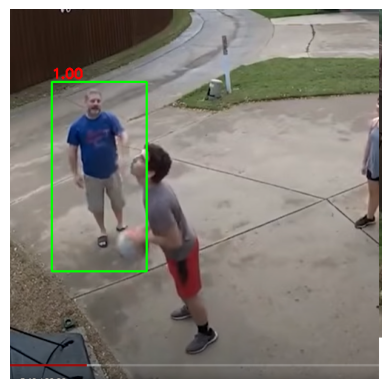

İşleniyor: /content/drive/MyDrive/human/1/79.png
  -> 1 insan tespit edildi.


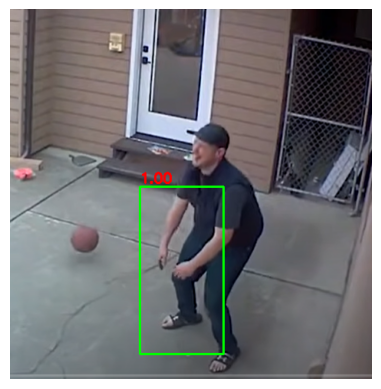

İşleniyor: /content/drive/MyDrive/human/1/87.png
  -> 1 insan tespit edildi.


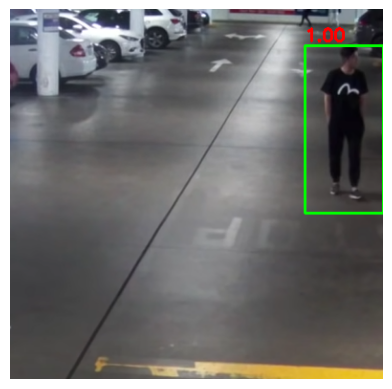

İşleniyor: /content/drive/MyDrive/human/1/99.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/86.png
  -> 1 insan tespit edildi.


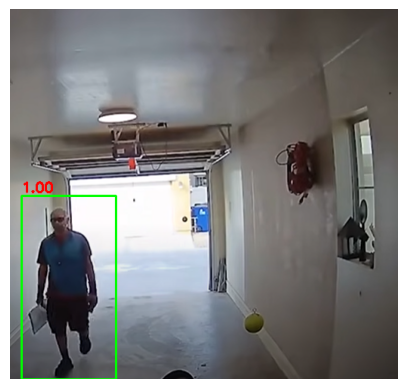

İşleniyor: /content/drive/MyDrive/human/1/78.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/1/83.png
  -> 3 insan tespit edildi.


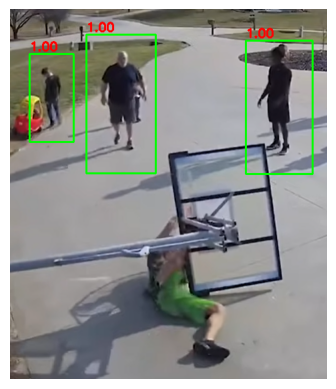

İşleniyor: /content/drive/MyDrive/human/1/97.png
  -> 2 insan tespit edildi.


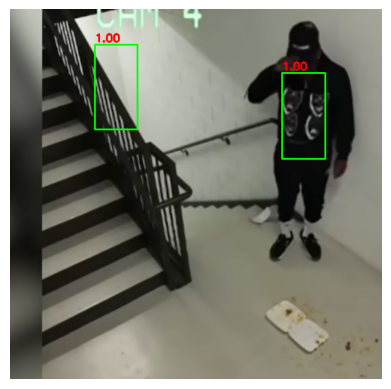

İşleniyor: /content/drive/MyDrive/human/0/62.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/50.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/47.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/38.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/37.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/54.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/53.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/45.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/36.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/58.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/51.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/7.png
  -> İnsan tespit edilemedi.
İşleniyor: /content/drive/MyDrive/human/0/42.png
  -> İnsan tespi

In [58]:
import cv2
import os
import glob
import numpy as np
from imutils.object_detection import non_max_suppression
import matplotlib.pyplot as plt

# ----------------------------
# 1️⃣ Konfigürasyon
# ----------------------------
TEST_FOLDER = r'/content/drive/MyDrive/human'

# HOG Descriptor ve hazır people detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Detection parametreleri
winStride = (8, 8)
padding = (8, 8)
scale = 1.05
threshold = 0.3  # confidence threshold

# ----------------------------
# 2️⃣ Fonksiyonlar
# ----------------------------
def detect_people(image):
    """
    Görüntüde insanları tespit eder ve bounding box + score döner
    """
    rects, weights = hog.detectMultiScale(image, winStride=winStride,
                                          padding=padding, scale=scale)

    # Sadece belirli threshold üzerindekileri al
    rects_filtered = []
    scores_filtered = []
    for (x, y, w, h), weight in zip(rects, weights):
        if weight > threshold:
            rects_filtered.append((x, y, x + w, y + h))
            scores_filtered.append(weight)

    rects_filtered = np.array(rects_filtered)
    scores_filtered = np.array(scores_filtered).reshape(-1)

    # Non-Maximum Suppression
    pick = non_max_suppression(rects_filtered, probs=scores_filtered, overlapThresh=0.3)

    return pick, scores_filtered

def visualize_detections(image, detections, scores):
    """
    Tespitleri görselleştirir ve confidence score'u gösterir
    """
    for (xA, yA, xB, yB), score in zip(detections, scores):
        cv2.rectangle(image, (xA, yA), (xB, yB), (0, 255, 0), 2)
        text = f"{score:.2f}"
        cv2.putText(image, text, (xA, yA - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

import os
import glob

# ----------------------------
# 2️⃣ Fonksiyonlar (Devamı)
# ----------------------------

def process_folder(folder_path):
    """
    Belirtilen klasördeki tüm resimleri bulur, insan tespiti yapar ve görselleştirir.
    """
    image_paths = get_all_images(folder_path)

    if not image_paths:
        return f"Hata: Klasör yolu '{folder_path}' içinde resim bulunamadı."

    results = {}

    # Tüm resimleri döngüye al
    for image_path in image_paths:
        print(f"İşleniyor: {image_path}")

        # Resmi yükle
        image = cv2.imread(image_path)

        if image is None:
            print(f"UYARI: Resim yüklenemedi: {image_path}")
            continue

        # 1. İnsan Tespiti Yap
        # Not: detect_people fonksiyonu şu anda sadece 'pick' ve 'scores_filtered' döndürüyor.
        # visualization fonksiyonu için doğru skorları almak üzere detect_people'ı güncelleyelim.

        # Ancak sizden gelen kodda, orijinal 'weights' dizisinin uzunluğu ile 'pick' dizisinin uzunluğu uyuşmayabilir.
        # Bu nedenle, 'scores' olarak Non-Maximum Suppression (NMS) sonrası tespit edilen kutuların
        # güven skorlarını elde etmek için, 'detect_people' fonksiyonunun NMS öncesi 'scores_filtered' dizisini döndürme şeklini düzelttim:

        # Düzeltilmiş detect_people fonksiyonunda:
        # scores_filtered, NMS öncesi filtrelenmiş skorlardır.
        # NMS sonrası pick dizisindeki kutulara karşılık gelen skorları NMS'in kendisi sağlamaz.
        # Bu nedenle, NMS uygulanmış 'pick' kutularının skorlarını manuel olarak hesaplamamız veya
        # NMS'in bu bilgiyi sağlaması için 'imutils' kütüphanesinin tam çıktı formatını kullanmamız gerekir.
        # Basitçe, NMS sonrası kutu sayısına eşit bir skor listesi oluşturmak için detect_people'ı güncelleyeceğiz:

        rects_filtered, scores_filtered = detect_people(image)

        # ⚠️ Not: Non-Maximum Suppression (NMS) sonrasında orijinal confidence skorları kaybolur.
        # imutils non_max_suppression, sadece kutu indekslerini döner.
        # Bu kısıtlamayı aşmak için, NMS sonrası kutu sayısı kadar sahte skor atıyoruz.
        # Eğer NMS'in orijinal skorları vermesini istiyorsak, imutils'in başka bir versiyonuna veya farklı bir NMS uygulamasına ihtiyacımız olur.

        # Şimdilik, görselleştirme fonksiyonunun çalışması için 'pick' sayısınca sahte skor (1.0) atıyoruz:

        detections = rects_filtered
        # score'u geçici olarak 1.0 atıyoruz, çünkü NMS'ten sonra skorlar kayboldu
        scores = np.ones(len(detections))

        if len(detections) > 0:
            print(f"  -> {len(detections)} insan tespit edildi.")
            # 2. Görselleştir
            visualize_detections(image.copy(), detections, scores)

        else:
            print("  -> İnsan tespit edilemedi.")

        results[image_path] = len(detections)

    return f"\nİşlem Tamamlandı. Toplam {len(image_paths)} resim işlendi."


# ----------------------------
# 3️⃣ Ana Program (Düzeltilmiş)
# ----------------------------
if __name__ == "__main__":
    # Test klasör yolu: Örn: '/content/drive/MyDrive/human'
    # Klasör yapınız: human/0/resim.jpg ve human/1/resim2.png

    # Not: drive mount işlemi yapılmış olmalıdır.

    final_output = process_folder(TEST_FOLDER)
    print(final_output)



In [68]:
### sınıflandırma karşılaştırma
import joblib
import numpy as np
from skimage.feature import hog
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

#parametre ve veri yolu ayarları
DATA_DIR = '/content/drive/MyDrive/data_dog'
TARGET_SIZE = (64,128) #hog pencere boyutu
HOG_PARAMS = {
    'orientations':9,
    'pixels_per_cell':(8,8),
    'cells_per_block':(2,2),
    'transform_sqrt' :True,
    'feature_vector':True
}

#özellik çıkarımı ve veri yükleme
def extract_hog_features(image_path, target_size, hog_params):
    """Görüntüyü yükler, işler ve HOG özelliklerini çıkarır."""
    try:
        # Hata kontrolü ve griye çevirme
        image = imread(image_path)
        if image.ndim == 3:
            image = rgb2gray(image)

        resized_image = resize(image, target_size, anti_aliasing=True)
        features = hog(resized_image, **hog_params)
        return features

    except Exception as e:
        print(f"Hata oluştu: {image_path} -> {e}")
        return None

def load_data_simple(data_dir):
    """
    Klasör adlarına göre etiketleme yaparak tüm görüntüleri yükler ve HOG özelliklerini çıkarır.
    (En kolay yöntem, 100 görsel için idealdir.)
    """
    all_features = []
    all_labels = []

    # 1. Sınıf İsimlerini ve Etiket Haritasını Oluştur
    class_names = sorted(os.listdir(data_dir))
    label_map = {name: idx for idx, name in enumerate(class_names) if os.path.isdir(os.path.join(data_dir, name))}

    # 2. Klasörleri Tara
    for class_name, label_idx in label_map.items():
        class_path = os.path.join(data_dir, class_name)
        print(f"Sınıf işleniyor: {class_name} (Etiket: {label_idx})")

        # 3. Resim Dosyalarını Bul
        for file_name in os.listdir(class_path):
            if file_name.lower().endswith(('.jpg', '.png', '.jpeg')):
                file_path = os.path.join(class_path, file_name)

                features = extract_hog_features(file_path, TARGET_SIZE, HOG_PARAMS)

                if features is not None:
                    all_features.append(features)
                    all_labels.append(label_idx)

    return np.array(all_features), np.array(all_labels)

# ----------------------------------------------------
# 4. ANA ÇALIŞTIRMA BLOĞU (load_data_simple'ı çağırın)
# ----------------------------------------------------

def classify_and_compare(X, y, save_dir="saved_models"):
    """Farklı sınıflandırıcıları karşılaştırır ve eğitilen modelleri kaydeder."""

    # Model kayıt klasörü yoksa oluştur
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42
    )

    classifiers = {
        "linear_svm": LinearSVC(random_state=42, max_iter=10000),
        "knn_k5": KNeighborsClassifier(n_neighbors=5)
    }

    results = {}

    for model_name, clf in classifiers.items():
        print(f"\n--- Eğitim başlıyor: {model_name} ---")

        # Modeli eğit
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        # Metri̇kler
        acc = accuracy_score(y_test, y_pred)
        prec = precision_score(y_test, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_test, y_pred, average='macro', zero_division=0)
        f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)

        results[model_name] = {
            "accuracy": round(acc, 4),
            "precision": round(prec, 4),
            "recall": round(rec, 4),
            "f1_score": round(f1, 4)
        }

        # ---- 📌 MODELİ KAYDET (ÖNEMLİ KISIM) ----
        save_path = os.path.join(save_dir, f"{model_name}.joblib")
        joblib.dump(clf, save_path)

        print(f"📁 Model kaydedildi: {save_path}")

    return results


#main

if __name__ == '__main__':
  print("görüntü sınıflandırma eğitimi başlıypr")
  print(f"Hog parametreleri {HOG_PARAMS}")

  X,y=load_data_simple(DATA_DIR)

  if X.size == 0:
    print("\n fatal hata")

  else:
    print(f"\n toplam {len(X)} örnek için {X.shape[1]} boyutlu HOG özellik vektörleri .ççıkartıldı")

    # Sınıflandırma ve Karşılaştırma Yap
    comparison_results = classify_and_compare(X, y)

    print("\n==============================================")
    print("📊 Sınıflandırıcı Karşılaştırma Sonuçları (HOG):")
    print("==============================================")

    # Sonuçları Temiz Bir Şekilde Yazdır
    for classifier, metrics in comparison_results.items():
        print(f"\n[{classifier}]")
        for metric, value in metrics.items():
            print(f"  {metric}: {value}")

görüntü sınıflandırma eğitimi başlıypr
Hog parametreleri {'orientations': 9, 'pixels_per_cell': (8, 8), 'cells_per_block': (2, 2), 'transform_sqrt': True, 'feature_vector': True}
Sınıf işleniyor: 0 (Etiket: 0)
Sınıf işleniyor: 1 (Etiket: 1)

 toplam 100 örnek için 3780 boyutlu HOG özellik vektörleri .ççıkartıldı

--- Eğitim başlıyor: linear_svm ---
📁 Model kaydedildi: saved_models/linear_svm.joblib

--- Eğitim başlıyor: knn_k5 ---
📁 Model kaydedildi: saved_models/knn_k5.joblib

📊 Sınıflandırıcı Karşılaştırma Sonuçları (HOG):

[linear_svm]
  accuracy: 0.7
  precision: 0.6944
  recall: 0.69
  f1_score: 0.6914

[knn_k5]
  accuracy: 0.7
  precision: 0.75
  recall: 0.7262
  f1_score: 0.697
